In [1]:
import glob
import warnings
import os
import random
import logging

from PIL import Image

import numpy as np

from keras.layers import (
    Input, Dense, Lambda, Conv2D, MaxPooling2D, UpSampling2D, 
    RepeatVector, Reshape, Flatten, BatchNormalization, Activation,
    AveragePooling2D, Concatenate, Conv2DTranspose
)
from keras.layers.merge import concatenate as concat
from keras.models import Model
from keras import backend as K
from keras.datasets import mnist
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam
from scipy.misc import imsave

from deeplab import BilinearUpsampling, SepConv_BN, _xception_block, _conv2d_same

import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')
%pylab inline

Using TensorFlow backend.


Populating the interactive namespace from numpy and matplotlib


In [2]:
def compose(*layers, **kwargs):
    out = layers[0]
    for layer in layers[1:]:
        try:
            out = layer(out)
        except:
            logging.error("Error with %s", layer.name)
            raise
    return Model(layers[0], out, **kwargs)

In [3]:
def imread(fname):
    im = Image.open(fname)
    if im.mode != 'RGB':
        im = im.convert('RGB')
    if im.size != (128, 128):
        print('Resizing', fname)
        im = im.resize((128, 128), Image.BILINEAR)
    return np.asarray(im) / 255.

In [4]:
from keras.callbacks import Callback

class ShowSample(Callback):

    def __init__(self, period=1):
        self.period = period

    def on_epoch_end(self, epoch, logs):
        if epoch % self.period == self.period - 1:
            self.draw()

    def on_train_end(self, logs):
        if len(logs) % self.period != self.period - 1:
            self.draw()
            
    def draw(self):
        v1 = [V1[i][0] for i in np.random.choice(np.arange(len(V1)), 3)]
        v2 = [V2[i][0] for i in np.random.choice(np.arange(len(V2)), 3)]
        orig_imgs = np.concatenate(np.expand_dims(v2 + v1, 0))
        pred = self.model.predict([orig_imgs, np.array([1] * len(v2) + [0] * len(v1))])
        pred_inv = self.model.predict([orig_imgs, np.array([0] * len(v2) + [1] * len(v1))])
        n_cols = 9
        n_rows = int(len(pred) / (n_cols / 3) + .5)
        plt.figure(figsize=(128 * n_cols / 96 * 2, 128 * n_rows / 96 * 2))
        for n, (a, b, c) in enumerate(zip(orig_imgs, pred, pred_inv)):
            plt.subplot(n_rows, n_cols, n * 3 + 1)
            plt.axis('off')
            plt.imshow(a.reshape(128, 128, 3))
            plt.subplot(n_rows, n_cols, n * 3 + 2)
            plt.axis('off')
            plt.imshow(b.reshape(128, 128, 3)) # * np.linalg.norm(i))
            plt.subplot(n_rows, n_cols, n * 3 + 3)
            plt.axis('off')
            plt.imshow(c.reshape(128, 128, 3)) # * np.linalg.norm(i))
        plt.show()

In [5]:
X1 = [(imread(i), 0) for i in glob.glob('c1/*.jpg')]
X2 = [(imread(i), 1) for i in glob.glob('c2/*.jpg')]

X = X1 + X2
random.shuffle(X)

Resizing c2/image0004008.jpg
Resizing c2/image0011604.jpg
Resizing c2/image0003448.jpg


In [6]:
X = [np.concatenate([np.expand_dims(i[0], 0) for i in X]),
     np.concatenate([np.expand_dims(i[1], 0) for i in X])]
y = X[0]

input_shape = X[0][0].shape

In [7]:
image_input = Input(shape=input_shape, name='image_input')
label_input = Input(shape=(1,), name='label_input')

label_2d = Reshape((128, 128, 1))(RepeatVector(128 * 128)(label_input))
encoder_input = concat([image_input, label_2d])

In [8]:
encoder_model = compose(
    Input(shape=K.int_shape(encoder_input)[1:]),
    Conv2D(32, 5, strides=2, padding='same', activation='relu'),
    #Conv2D(32, 5, activation='relu'),
    MaxPooling2D(2),
    Conv2D(64, 3, strides=2, padding='same', activation='relu'),
    #Conv2D(64, 5, activation='relu'),
    MaxPooling2D(2),
    Conv2D(128, 3, strides=2, padding='same', activation='relu'),
    #Conv2D(128, 5, activation='relu'),
    #MaxPooling2D(2),
    #Conv2D(256, 5, strides=2, padding='same', activation='relu'),
    #MaxPooling2D(2),
    #Conv2D(256, 3, strides=2, activation='relu'),
    Conv2D(16, 3, strides=2, activation='relu'),
    #Conv2D(256, 5, activation='relu'),
    #Conv2D(512, 3, padding='same', activation='relu'),
    #Conv2D(512, 3, padding='same', activation='relu'),
    #Conv2D(256, 3, padding='same', activation='relu'),
    #Conv2D(512, 3, activation='relu'),
    #Conv2D(512, 3, activation='relu'),
    #Conv2D(512, 3, activation='relu'),
    #Flatten(),
    name='encoder',
)
encoder_model.summary()
encoder = encoder_model(encoder_input)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128, 128, 4)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 64, 64, 32)        3232      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 64)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 4, 4, 128)         73856     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 1, 1, 16)          18448     
Total para

In [9]:
_, encoder_size, _, n_z = K.int_shape(encoder)

mu = Dense(n_z, activation='linear', name='mu')(encoder)
l_sigma = Dense(n_z, activation='linear', name='l_sigma')(encoder)

def sample_z(args):
    mu, l_sigma = args
    eps = K.random_normal(shape=K.shape(mu), mean=0., stddev=1.)
    return mu + K.exp(l_sigma / 2) * eps


# Sampling latent space
z = Lambda(sample_z, output_shape=K.int_shape(encoder)[1:])([mu, l_sigma])

In [10]:
zc = concat([Flatten()(z), label_input])
hidden_dim = 256
decoder_model = compose(
    Input(shape=(n_z + 1,)),
    Dense(hidden_dim, activation='relu', name='d_h1'),
    Dense(hidden_dim, activation='relu', name='d_h2'),
    Dense(hidden_dim, activation='relu', name='d_h3'),
    Dense(hidden_dim, activation='relu', name='d_h4'),
    Dense(X[0][0].size, activation='sigmoid', name='d_out'),
    Reshape((128, 128, 3), name='d_out_reshape'),
)
decoder_model.summary()
decoder = decoder_model(zc)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 17)                0         
_________________________________________________________________
d_h1 (Dense)                 (None, 256)               4608      
_________________________________________________________________
d_h2 (Dense)                 (None, 256)               65792     
_________________________________________________________________
d_h3 (Dense)                 (None, 256)               65792     
_________________________________________________________________
d_h4 (Dense)                 (None, 256)               65792     
_________________________________________________________________
d_out (Dense)                (None, 49152)             12632064  
_________________________________________________________________
d_out_reshape (Reshape)      (None, 128, 128, 3)       0         
Total para

In [11]:
cvae = Model([image_input, label_input], decoder)
cvae.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_input (InputLayer)        (None, 1)            0                                            
__________________________________________________________________________________________________
repeat_vector_1 (RepeatVector)  (None, 16384, 1)     0           label_input[0][0]                
__________________________________________________________________________________________________
image_input (InputLayer)        (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
reshape_1 (Reshape)             (None, 128, 128, 1)  0           repeat_vector_1[0][0]            
__________________________________________________________________________________________________
concatenat

In [12]:
def vae_loss(y_true, y_pred):
    recon = K.sum(K.binary_crossentropy(K.flatten(y_true), K.flatten(y_pred)), axis=-1)
    kl = 0.5 * K.sum(K.exp(l_sigma) + K.square(mu) - 1. - l_sigma, axis=-1)
    return recon + kl

def KL_loss(y_true, y_pred):
    return (0.5 * K.sum(K.exp(l_sigma) + K.square(mu) - 1. - l_sigma, axis=1))

def recon_loss(y_true, y_pred):
    return K.sum(K.binary_crossentropy(K.flatten(y_true), K.flatten(y_pred)), axis=-1)

In [13]:
V1 = [(imread(i), 0) for i in glob.glob('v1/*.jpg')]
V2 = [(imread(i), 1) for i in glob.glob('v2/*.jpg')]

V = V1 + V2
random.shuffle(V)

V = [np.concatenate([np.expand_dims(i[0], 0) for i in V]),
     np.concatenate([np.expand_dims(i[1], 0) for i in V])]
v = V[0]

In [14]:
cvae.compile(
    #optimizer=Adam(lr=1e-3),
    optimizer='adam',
    loss=vae_loss,
    metrics=[KL_loss, recon_loss],
)

Train on 10000 samples, validate on 1000 samples
Epoch 1/1000
10000/10000 [==============================] - 11s 1ms/step - loss: 1012959.9381 - KL_loss: 2.0936 - recon_loss: 1012926.4442 - val_loss: 976528.8565 - val_KL_loss: 4.6603 - val_recon_loss: 976454.2843


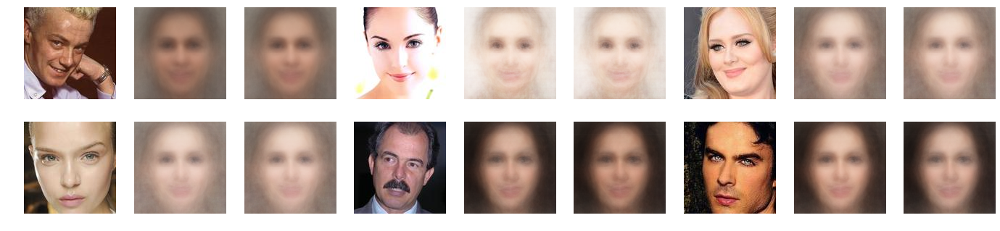

Epoch 2/1000
10000/10000 [==============================] - 10s 990us/step - loss: 960721.3752 - KL_loss: 6.2610 - recon_loss: 960621.2039 - val_loss: 944844.1782 - val_KL_loss: 6.1609 - val_recon_loss: 944745.6208


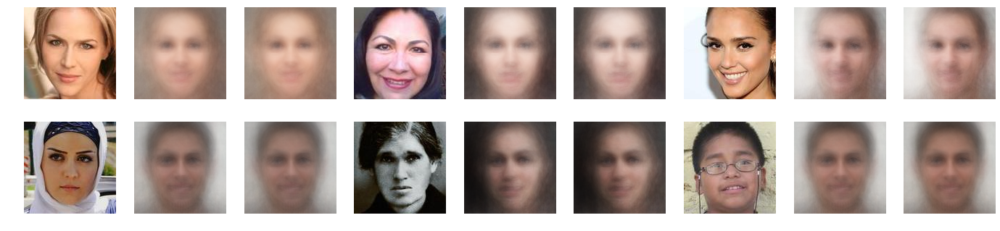

Epoch 3/1000
10000/10000 [==============================] - 10s 985us/step - loss: 946776.7328 - KL_loss: 6.5971 - recon_loss: 946671.1781 - val_loss: 935678.0452 - val_KL_loss: 6.6177 - val_recon_loss: 935572.1497


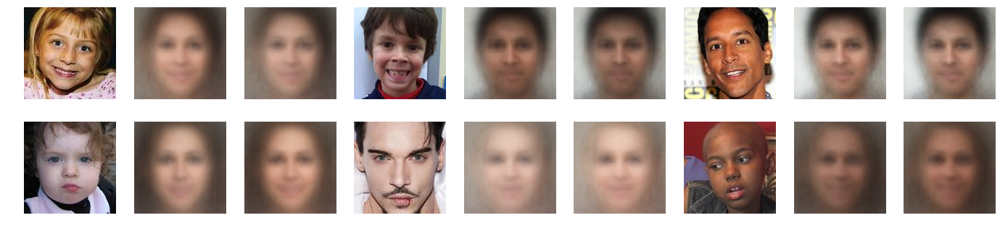

Epoch 4/1000
10000/10000 [==============================] - 9s 917us/step - loss: 941290.9990 - KL_loss: 6.5376 - recon_loss: 941186.3962 - val_loss: 932341.4182 - val_KL_loss: 6.7009 - val_recon_loss: 932234.2068


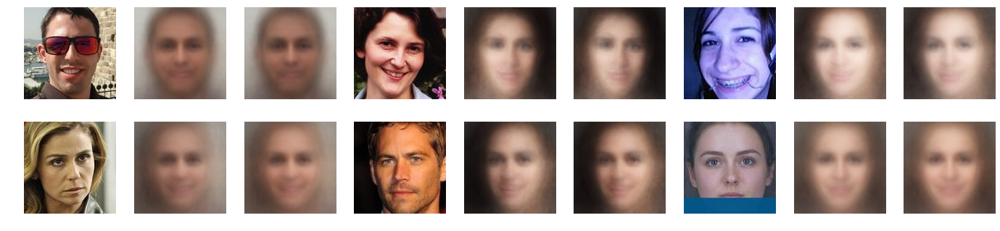

Epoch 5/1000
10000/10000 [==============================] - 10s 995us/step - loss: 939438.8692 - KL_loss: 6.2880 - recon_loss: 939338.2613 - val_loss: 933885.6848 - val_KL_loss: 6.3991 - val_recon_loss: 933783.2990


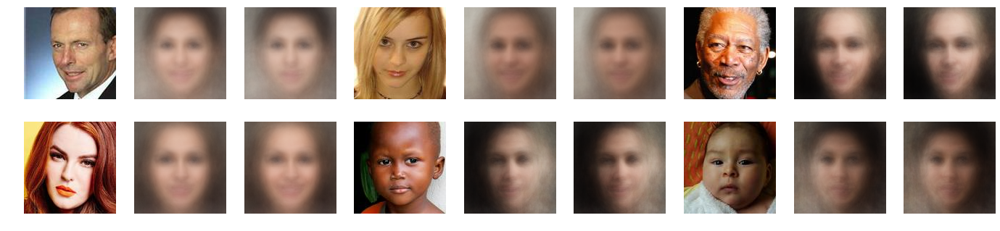

Epoch 6/1000
10000/10000 [==============================] - 10s 972us/step - loss: 938403.6063 - KL_loss: 6.0650 - recon_loss: 938306.5682 - val_loss: 930487.1317 - val_KL_loss: 6.2451 - val_recon_loss: 930387.2010


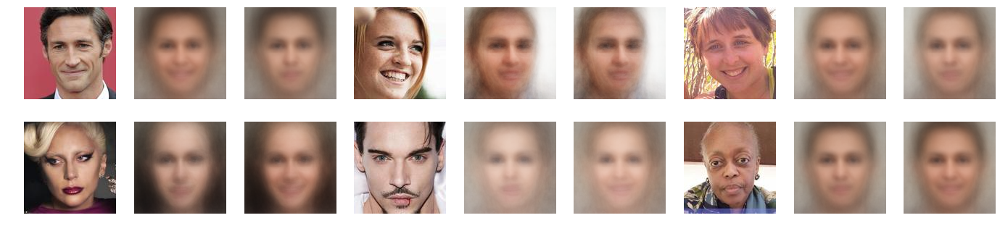

Epoch 7/1000
10000/10000 [==============================] - 9s 908us/step - loss: 937968.3439 - KL_loss: 5.7870 - recon_loss: 937875.7488 - val_loss: 930360.9537 - val_KL_loss: 6.2523 - val_recon_loss: 930260.9319


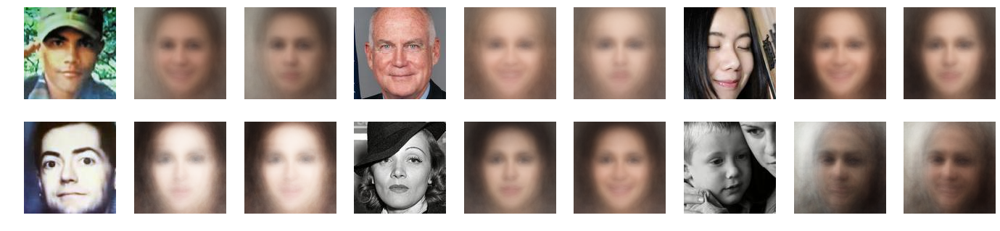

Epoch 8/1000
10000/10000 [==============================] - 9s 917us/step - loss: 937331.0093 - KL_loss: 5.7014 - recon_loss: 937239.7841 - val_loss: 930461.1763 - val_KL_loss: 6.0736 - val_recon_loss: 930364.0062


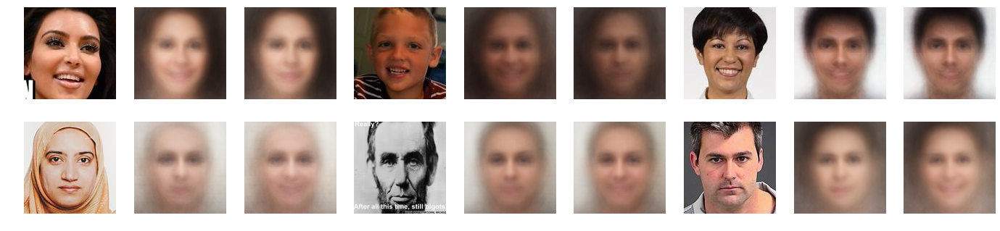

Epoch 9/1000
10000/10000 [==============================] - 10s 995us/step - loss: 937123.4408 - KL_loss: 5.5298 - recon_loss: 937034.9626 - val_loss: 929130.8655 - val_KL_loss: 5.8461 - val_recon_loss: 929037.3209


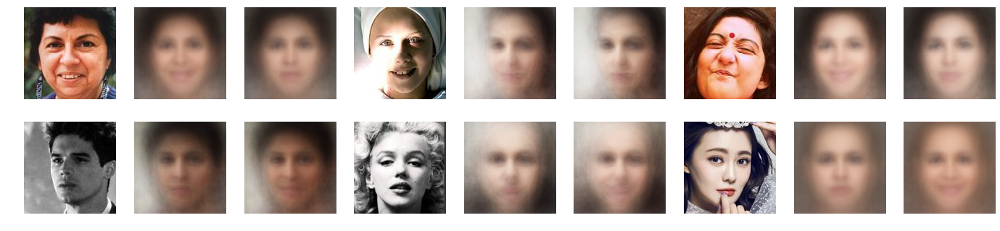

Epoch 10/1000
10000/10000 [==============================] - 10s 990us/step - loss: 936662.5955 - KL_loss: 5.4437 - recon_loss: 936575.4968 - val_loss: 925675.7389 - val_KL_loss: 5.9671 - val_recon_loss: 925580.2594


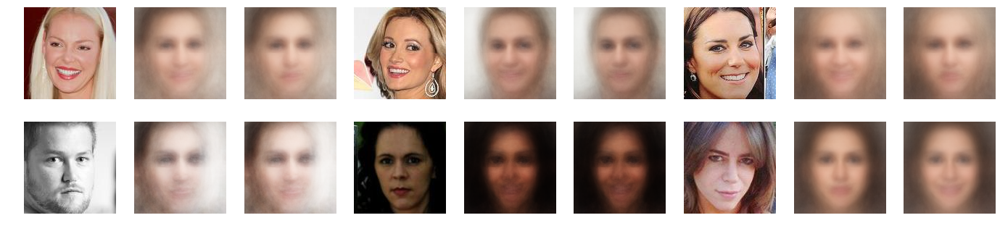

Epoch 11/1000
10000/10000 [==============================] - 10s 994us/step - loss: 931246.8518 - KL_loss: 5.9127 - recon_loss: 931152.2493 - val_loss: 922469.7990 - val_KL_loss: 6.3849 - val_recon_loss: 922367.6455


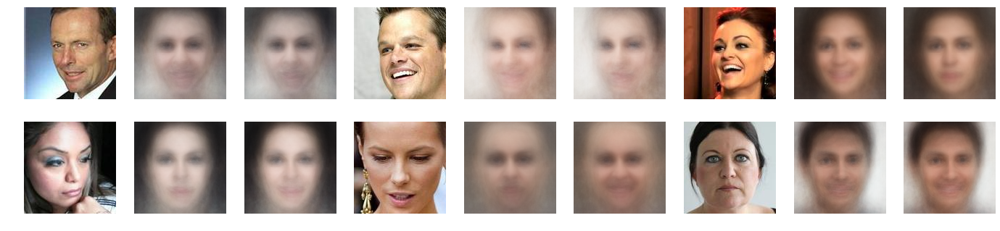

Epoch 12/1000
10000/10000 [==============================] - 9s 917us/step - loss: 929121.5062 - KL_loss: 5.9073 - recon_loss: 929026.9885 - val_loss: 922048.1685 - val_KL_loss: 6.5547 - val_recon_loss: 921943.2945


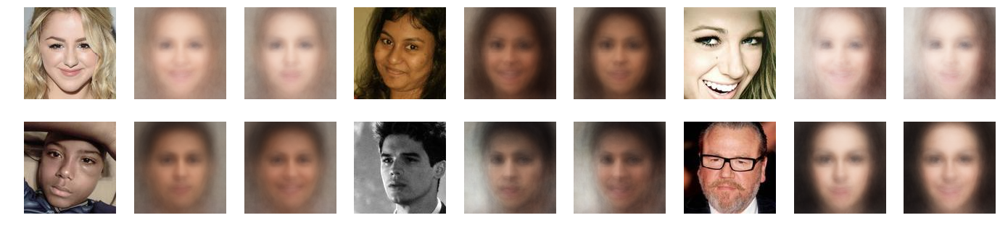

Epoch 13/1000
10000/10000 [==============================] - 9s 876us/step - loss: 928455.4946 - KL_loss: 5.7930 - recon_loss: 928362.8060 - val_loss: 919971.8200 - val_KL_loss: 5.9165 - val_recon_loss: 919877.1558


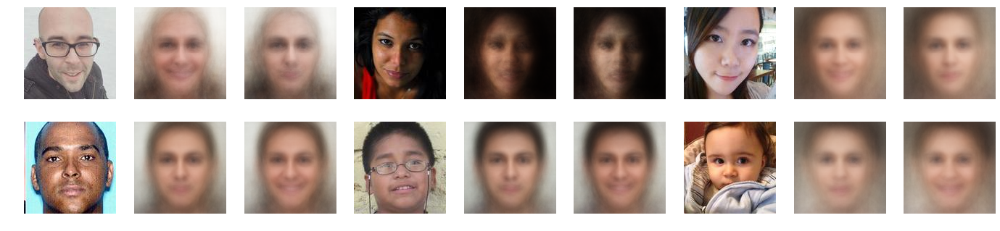

Epoch 14/1000
10000/10000 [==============================] - 9s 876us/step - loss: 927871.0385 - KL_loss: 5.8366 - recon_loss: 927777.6501 - val_loss: 919509.9173 - val_KL_loss: 6.1882 - val_recon_loss: 919410.8958


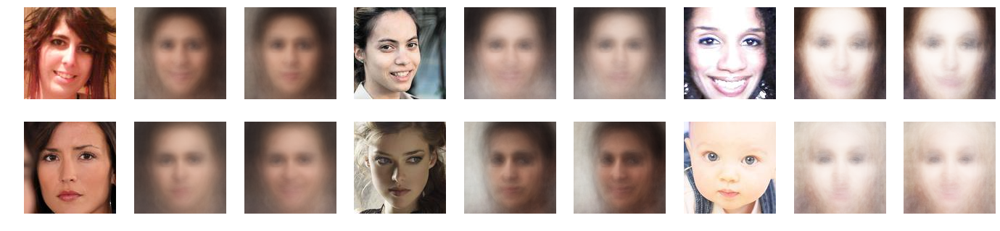

Epoch 15/1000
10000/10000 [==============================] - 10s 997us/step - loss: 927513.4482 - KL_loss: 5.8511 - recon_loss: 927419.8317 - val_loss: 920106.8755 - val_KL_loss: 6.1280 - val_recon_loss: 920008.8300


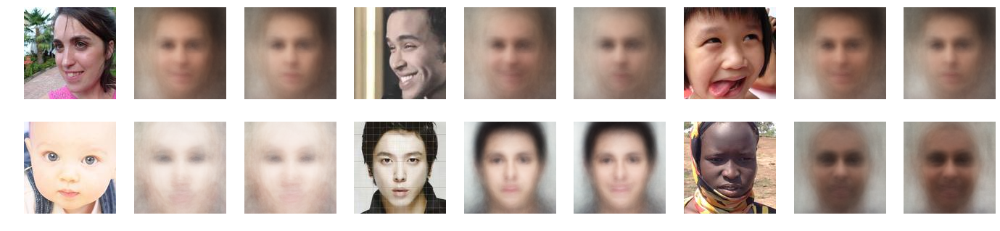

Epoch 16/1000
10000/10000 [==============================] - 10s 970us/step - loss: 927211.1205 - KL_loss: 5.8254 - recon_loss: 927117.9170 - val_loss: 919065.9457 - val_KL_loss: 6.1825 - val_recon_loss: 918967.0245


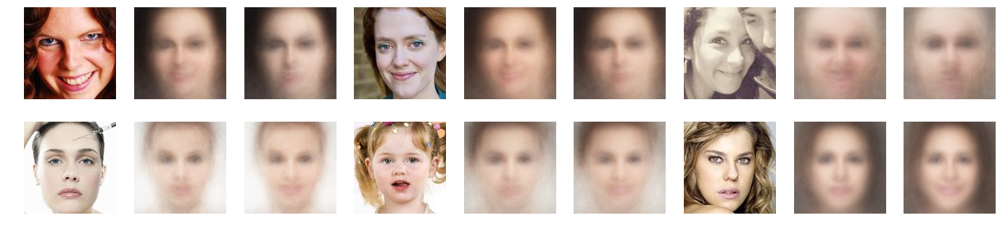

Epoch 17/1000
10000/10000 [==============================] - 10s 975us/step - loss: 926772.7386 - KL_loss: 5.9114 - recon_loss: 926678.1532 - val_loss: 919243.2286 - val_KL_loss: 6.1184 - val_recon_loss: 919145.3235


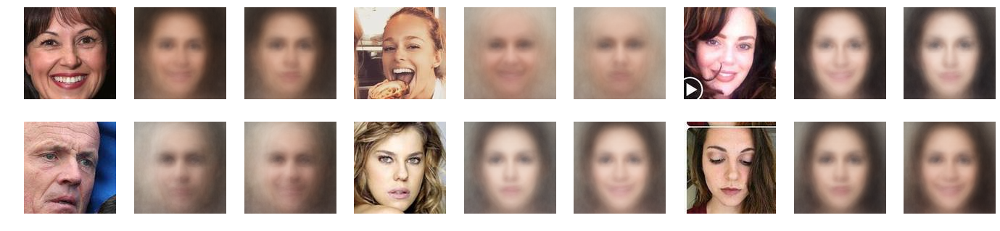

Epoch 18/1000
10000/10000 [==============================] - 10s 967us/step - loss: 926436.5069 - KL_loss: 5.8529 - recon_loss: 926342.8594 - val_loss: 918920.0300 - val_KL_loss: 6.0729 - val_recon_loss: 918822.8676


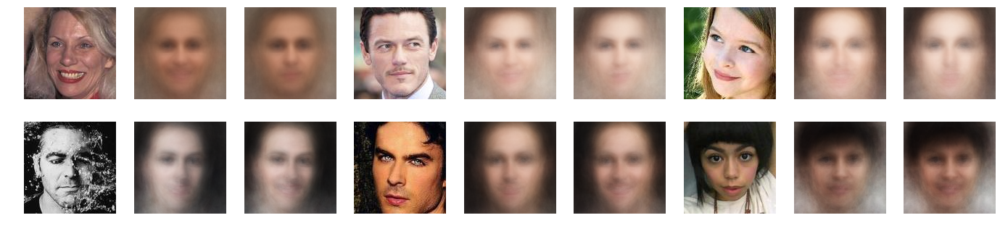

Epoch 19/1000
10000/10000 [==============================] - 10s 974us/step - loss: 926343.2073 - KL_loss: 5.9273 - recon_loss: 926248.3722 - val_loss: 919114.3133 - val_KL_loss: 6.2616 - val_recon_loss: 919014.1320


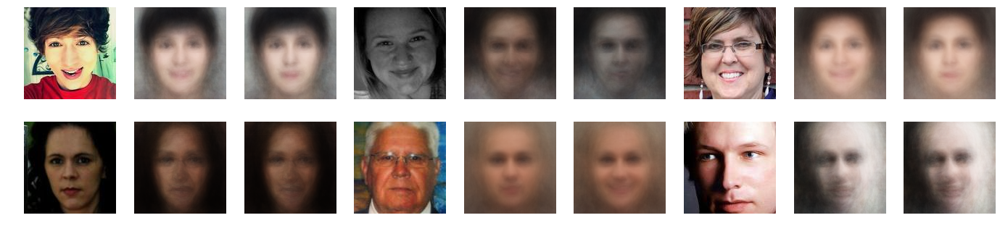

Epoch 20/1000
10000/10000 [==============================] - 10s 976us/step - loss: 926126.5790 - KL_loss: 5.9367 - recon_loss: 926031.5927 - val_loss: 919369.1735 - val_KL_loss: 6.0061 - val_recon_loss: 919273.0689


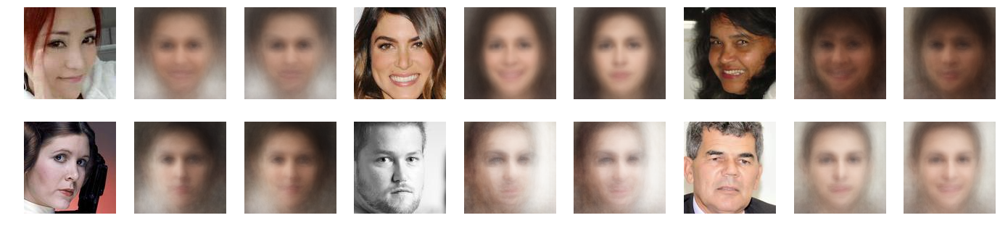

Epoch 21/1000
10000/10000 [==============================] - 10s 968us/step - loss: 925749.1840 - KL_loss: 5.9835 - recon_loss: 925653.4479 - val_loss: 918815.3808 - val_KL_loss: 6.1035 - val_recon_loss: 918717.7238


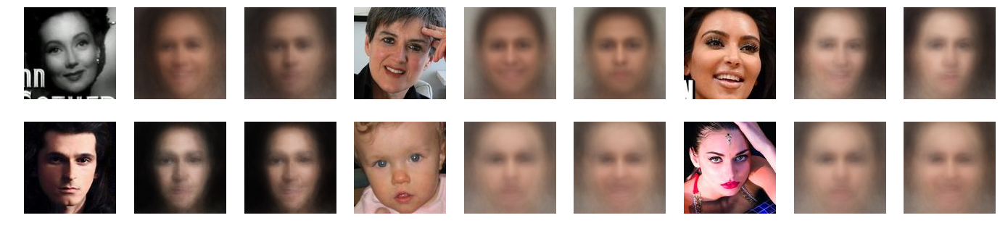

Epoch 22/1000
10000/10000 [==============================] - 10s 979us/step - loss: 925490.4875 - KL_loss: 6.0241 - recon_loss: 925394.1019 - val_loss: 918963.5563 - val_KL_loss: 6.2002 - val_recon_loss: 918864.3534


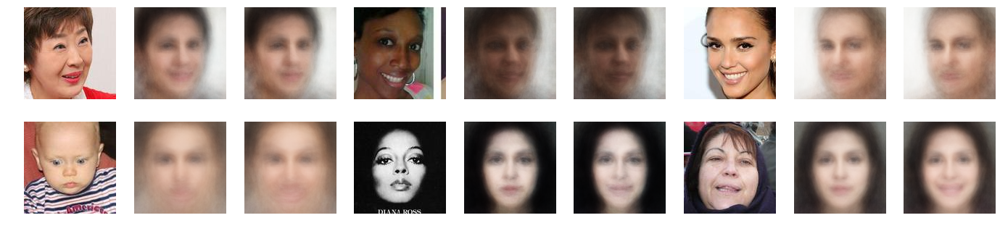

Epoch 23/1000
10000/10000 [==============================] - 9s 861us/step - loss: 925165.3246 - KL_loss: 6.0894 - recon_loss: 925067.8938 - val_loss: 919645.2022 - val_KL_loss: 6.7131 - val_recon_loss: 919537.7808


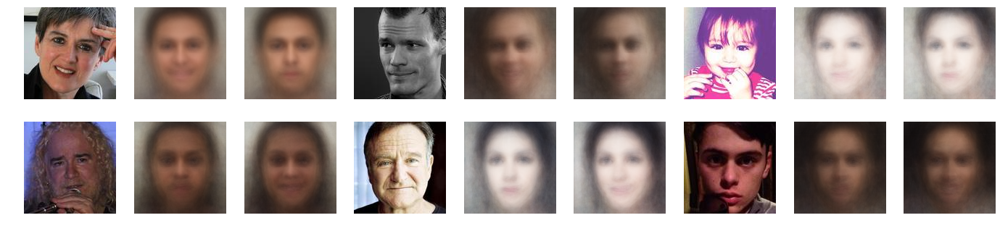

Epoch 24/1000
10000/10000 [==============================] - 10s 964us/step - loss: 924920.5773 - KL_loss: 6.2419 - recon_loss: 924820.7067 - val_loss: 919411.3800 - val_KL_loss: 6.4220 - val_recon_loss: 919308.6270


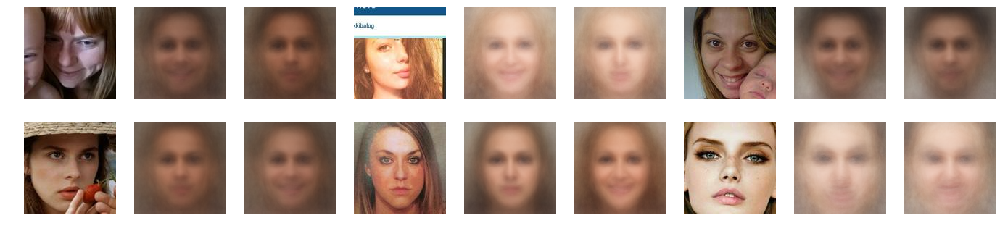

Epoch 25/1000
10000/10000 [==============================] - 9s 859us/step - loss: 924665.2351 - KL_loss: 6.1905 - recon_loss: 924566.1850 - val_loss: 919428.8585 - val_KL_loss: 6.1345 - val_recon_loss: 919330.7119


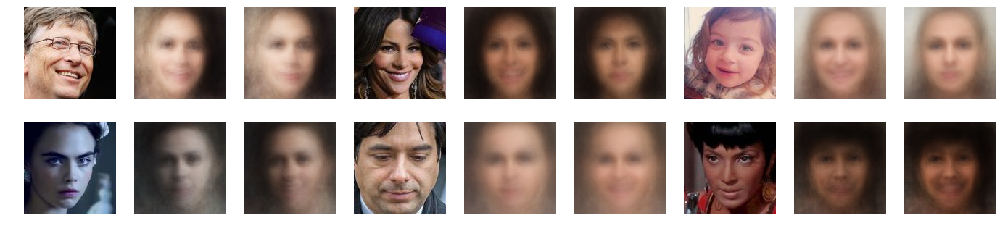

Epoch 26/1000
10000/10000 [==============================] - 9s 859us/step - loss: 924420.3623 - KL_loss: 6.1447 - recon_loss: 924322.0476 - val_loss: 919663.0957 - val_KL_loss: 6.4575 - val_recon_loss: 919559.7755


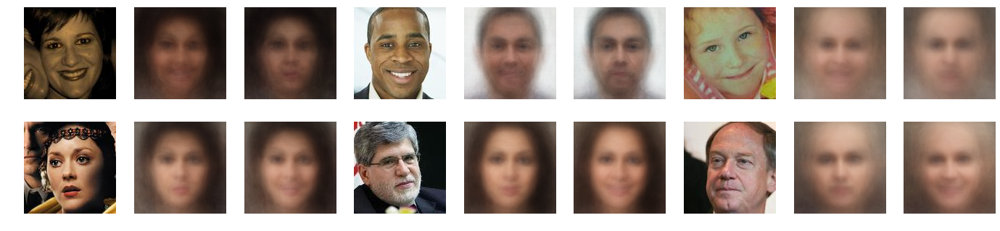

In [15]:
# compile and fit
cvae_hist = cvae.fit(
    X, y,
    verbose=1,
    batch_size=32,
    epochs=1000,
    validation_data=(V, v),
    callbacks=[
        EarlyStopping(patience=5),
        ShowSample(),
    ],
)

TODO:

* сверточная сеть
* добавить тот крутой маленький датасет
* GAN+VAE

In [16]:
cvae.save('model.h5')

In [17]:
from keras.

SyntaxError: invalid syntax (<ipython-input-17-364a84204731>, line 1)